In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input, decode_predictions
# from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

In [ ]:
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
pretrained_model.trainable = False

# ImageNet labels
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

14536120/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Helper function to preprocess the image so that it can be inputted in MobileNetV2
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

# Helper function to extract labels from probability vector
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

4681/4681 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step

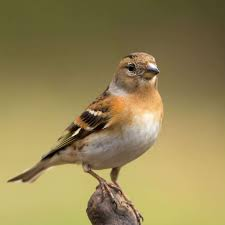

In [ ]:
# image_path = tf.keras.utils.get_file('pineapples.jpg',
#     'https://images.pexels.com/photos/128756/pexels-photo-128756.jpeg?auto=compress&cs=tinysrgb&dpr=1&w=500')

# image_raw = tf.io.read_file(image_path)
# image = tf.image.decode_image(image_raw)
# image = preprocess(image)
# image_probs = pretrained_model.predict(image)

image_path = tf.keras.utils.get_file('Bramblings.jpg',
                                     'data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxAPDw8PDxAPDw8NDQ8ODw4PDw8ODQ0NFREWFhURFRUYHSggGBooGxUVITEhJSorLi4uFyEzODMvNygtLisBCgoKDg0OFxAQFy0eHR0tLS0tLS0tLS0tLS0tLS0tLS0tKy0tLS0tKy0tLS0tKystLS0tLS0rKysrKystLS0tLf/AABEIAOEA4QMBIgACEQEDEQH/xAAbAAACAwEBAQAAAAAAAAAAAAAAAgEDBAYFB//EAD8QAAEDAwIDBgMGAwUJAAAAAAEAAhEDEiEEMQVBUQYTImFxgTKRsSNCcqHB8BRS4RYzQ2LRBzRTdIOis8LS/8QAGQEBAQEBAQEAAAAAAAAAAAAAAAECAwQF/8QAJBEBAAMAAgIBBAMBAAAAAAAAAAECEQMhEjFRBBMiQTNhcTL/2gAMAwEAAhEDEQA/AObQhC+Y6BSoUoCEKVEIIRCmEIFUJlCoiFCaEQgVClBCBUKUIIUFShaClKQnhQmBIUJyFBCoVKQrIUQgqISq0hIQqFSp1CBYQpUrQ9JQAmQuAVClSqIQpQoIUoQgiFEJkKhUQmQgWFBCZBCCuFCshRC1C4RCeFEKmEQnhFqLhIRCeFEIYSFBCeFBCq4qISkK0hKQiYqISkK0hI4IYWFCZCqY9KEQnhRC4mEhEJ4RCphYRCdEIpIUwmhTCGEhEJ4RCGEhEJ4RCGEhRCshEIKkQrCFEKxKkhEKyEQqK4RCstRaqKoRCtLUpagrhKWq0tSkIqohLCtISkKipwSEK4hVuCISEKVK0PSIQrbVFq4IqhTCstRaiq0QrLUWoK4UwrLUQgrAUwrIRCCuFNqeFMKiu1FqshEIKi1LCutlbhoaDc1y120NLjZMZBA3U3Gq1mWHTUW1J+1pNjJufkD0C9ClwMuwKrPLwvM+eOXmq6nCaNCq57adt1tQ0nSGmw5c1pE48W30XqaTXUWFjA5jLcEtNrW9QMRz67LUz8Q6VpH7eVquEVafIPA3dTNwHqNwsNq+gaTViqxwpMdU7sgONNoME/ebvIz9FzPaSiwVWuptLQ9gvBaW/aj4jHng4UrbUtTPTxC1KQriEpatawqISkK0hKQqKSEpCucEhCoqISEK4hI5qIphQnhC0j2LUWq+1RYvOqm1FqusRYqYptRYrrEWIKbVFqutRahioBTarLEwYhii1TarrUWoYptRarg1FqKqGM8xt6rJX0eoqk2VGNdOAW3A+XotOrfa5jdpB23O8q2kXAh1Mi6MbBbiM7luPWOLqfxtPVnvqLmupVrxUse0vLTycMOBHPOD0XRv1rvA0MD2/C0EsJwZgYwc8sCF6Wt1hMOqaZmLckiyQZBkAO3AxPJea6lUbaaYBDmuF1puY3JNrifXYBdptFmIrNW3gfbP+BqbOEEi0NEOEn4o58vYL3uM9qdLxRjRSaGV2m+MePEObmCDz87Y3hcY2rSJ7rujfIb/AHfiJK93U9jmaVlHUVHXVni8Up8NFsi0xzdPyUjkjx8ZqWrMzusxCQhXWqCFwgUkJCFcWpSFrRSQkIV5CQtVFBalIV5Crc1BTClPChaZe/YixaLEWry60osUWLTYixXRnsUFi1WKLFNGQsRYtJpqO7ViRnDFNqvsRYrootUWq+xFiaKLVZpGNdVbTJ+6Xkf5R/UpNVWFNpJzAJAG5/0WfsxxNhqF5BNSr4HO3DWA4DcYH1XSkb3Poxo4ponB3eAEiC2dw0kyYXm0tW5j+fTOw9F3tLRtfklr29CTj2WHinZ9rhLBBAwMD3Xe0RMEbrldXq5EkyBkdQVfwTV+Ak853HiIO+OSitwSoNxAG53nqmpaZzMRg48zHNeebxHp3ikz7ehwvU021A4NbM2kQIAnl02WnjerdWc9ztmtpMb8yT+iw6PTZnrE4gr36vDe8ovgeMAFv+aMx9Vx+5323PH+PTlbUpatBYlLF1eVnLUpatBYkLVRnLUpatBYkLVdGctSOatBakLU0UWoV1qlXyR0NqmxXWJgxeZVFiLFosU2IM9iLFosUWorOWJSxabVBYiMxYosWqxLYqM9iy6zVspW3Tc82ta0XOLvRbNRUDIlzW3GAXuDWjzJPJZNfpq2nY6uKLqzCy/vqYLw6TaD9MBarE/DdaxPuXnGlUqES6xskDvB4nzgmAY9MLfpmUaRDGAl+1zoE+fouf1msqMa2o+i5vwubUexzWw7A8URz29E3DNfUrVCCTAMCCPEeceQS1b5v6d62rE47fQVSCJ28o36r121CcHPPeZ/05LntHUAgDcZOT+uV62mqA5Jjp6+q8Nb28sey0V8UaqhM7/ULM7QXZjMRG3kvX0UOHLf39Vs/hYEiPTzXXty2PTxNPoo5RtjplelpRaBy9d/RaWaZwy4YPRD9OSQIx5LM6mw5HiVG2q+BAJuHvlYyxe7x6nFQfh/Uryyxeqtuo14rxlpZCxK5i1liQsWtYZCxKWLWaaXu1dGM00hYtpYq3MVGS1Cv7tCI6GxMGq21TavPrWKrUWq61EJq4ptUQrrUWoYptRarrUWpCKLVTqH2AneBMdUcS1raLZJFxBtbzPn6Lk/7Y0DFKqcy894IAceQ/T29l0ilpjYhqvj5fl6cx2k4jWqVS6p4QXEMbMkAcmg7+uy9HgPbvU6Wxk95RY6TRcZaXW2hgdkwMHphbOJcHZqSbZvcGgmnh7wRIbJzGy5erwWrTqGn3bhZguLSwegn4W9Sclezi5K2rnwzyUmsuy1HbQ1qYp12U4q1C+oA28OM8weQwFOg4m2s4tpMIaYgNEHHMn7o9VwVTWNY+2l9q8m0viWk7Qwcx+/NfQeGUm6CiHah7XalwB/h2wRRnIBHIrnyUiI2IapaZnNeu1gYBdv64H0WmnqwB67TyXNv4g+oZ2C9HQsL4IwD+5XkrxS9E8kOq4IZOTE/Ed8Sum09ISOYPzXK8Io2z59DyHMrotLVJjkR9F1pxddw5X5O/b3RSZAwsGogExs0rRpqktuPLCza0AMdO7g4j5Lvfi2OnGt8lyHEiS/O4k+xMj8liLFu1I8buew9gAFSWryR06z3OspYlLFqLEpaqzjLYlLFqLUpammMrmKpzFsLFU5iupjN3aFotQr5MvbtU2p4RC87RYUQrIUQqEtRanhEIK7Ur8Cfrsrl4XF3ODi57jaMUqQwCYy50ZJ8hy6rVY0eB247uwhj3OrOOTPh8h/QLFw7hel4PQdq9YQ/iTqZOk0b7XGk5zfDVqMHw+/TCo4jrw0l4IvO1QkG3b4Yn5tn8Tdl4tLhDtSXVHEw7xOe8y956x/UnzK9nH1HcszsqOH8XrUnvr96++o4uMm4ucSTJ85J+a9t+n4hxCn9rLKTjdaS5pqdCROff5L0ezvAaFI944hz48JqCbfRoXYd+xoFoBIG5ELfls9LMZHbheFdi3UnXkkPbsWkgj0K9CrwRrIEQegwAugra8F2+SNhj9hYquqmR74GFZ45n3Kebz6ektbGwC9Hhbi0fhkAckjmbEnblyHsm08NJkyDlWOLJSb69/Q6o46HkvY4fXguLvYSVyVHVRgchut9PXgEcyQunTDr6GuBEbCd+sKrWau5l3JvhHmSuera+A1swPLfeYV9Gu57ROGyYH6rnyXysrWvZHZM9VBCutSlq+fr0KC1KWq8tSkJpii1LYry1QWpqM5aqnNWotSFqujPYhXWoU1nHqwphSpXMLCiE6hBEKITLje1va86dz6FBveVh4QB8LTHxOPL03XTj45vOQkzj1ePdoaOlkPcJAmBmD59F884j2jr6wuGmpuqDa948EenP6eU5Wfh/AtRraprax5sBm04DnenILoNJoaWncQwmHGYmAML2VpSn9s9y87Q9m3Pb3upLnVJuhx2PorqWnq0hVIEtFtgMeIc16+odc2A4jG3JVaclpy7lHLfqkzEy6RGQfgeiD2l1YzUeIAaSLWdBC9ivRGBGW7ScLzWV3MJh2PIn5KmpxBxO661mIc7RMtz9G1oLnOl0yOXsq6moAMCJ5wAQPKVgdXLtyo70D95W/NnxXVqp2nnk+SqdW2z7LPUqk+SQBYmzWNzNRHOPRXs1BG3Pmd4WGiwmAASTsBkkrpOFdn3GH6jA3FLmfxdPRc78kVjtYgcJ0jqpDjimPvHd56BdC1gGBgDbyTtYAAAIAEADAAUwvFfkm0txGEISlqtISkLGtKSEtqvLUhamiktUEK6EsK6KSEhatBakLU0UQhXWqVNYbYRCeFEKBYQGrFxLjGn0397UE/yN8Tz7clyXFu11WvLKLe5pf97h5ldacU2R73HeNtpCymQXnBI5ei4toYXkwLiZPNxJRotFV1DiGbffqu2C7XgHZ2jQh5be/e9+ZPou/48cL/AK8bT8K1VRgsplrORPhB+e6up9larvjcwe5JXaOeTv8A0CVcLcsz6NcsOyA/4zgfJuPzKX+yduRUvJP3hsF1aFn7lvk1864twurTqVIPgY1pxzx+/kvM0WqviQWnnOSvo3F9A+qJpOYHWlpDwS1w5TC4+lTOlqFmuoh7HmQ9k4gASwiJGBg5XppyxNf7MYahHI+6raF3ej4Po3tFSmxr2nY3OcPkT+Sfiraem09WpTpMDmsNsMaPEcBZ+/3kQjgrmTBcJPKc/Je5wrgL60Od9nTPM/E4eQXJ9nNCamqY3PjcS8+U5X2FjQAAMACAPJXm5Jr1AyaDhlKgPA3PN5y8+62whSvJMzPtYLCITIRosKCE6hFVkJYVpCWEFZCUtVhCiEFZCUhWQoIQVwhPCEZaKjoBMEwJgbnyC5niB4nqDZSYzS0zi4umpHmRsupQtVt494y4LWdiajKTqhqnUV9wwYBPmTuqND2Xruh1dvdsGbG5c49F9DQuv35+CHkcK4faBc0MY34KY+rl66ELja0zOyTIUoQogUKVCggqjV6VlZhZUaHNPI8vMdCtBSVHQCcYE5wFFch3dXRVzSZU8Dm97TLiIdTGCxwO5HXde6+u3Uad7H203va5jmlwIa+MZ+RXJ16dY1GVdS681HWuazJax2A1g6zA+ao09K5hpuqGlqtI42O+IVKIOL2zmI/P1XvniiYjfbeb7el2N4f3epqioQKlIQGHfPMeS7ZfOKXHXt1DBWpgVWO8FTTsILx/LbzHkIX0DQ6ptamyqwgteJBH5rj9RSYyWZz3C9ShC82oEKYRCLEoQhCutIUEJlBRSEJSE5SlNCwoITKFQqEyFllehQiVpgIRKJQCFEqJUDISyiU0MhRKiVBJK5ntDxMl5oMIinBf/mduB7fVdDXqWsc7+VjnfISvluk1L31XPdJtBcCcF7nbjzXo+mpszaf0R7bOLX02Ne59we5rgBAiDueYVB1L6Velq4Ba1+WPtN1Mn4Y5YwhlVtcgPdhjptGNtpKbieklnSRy555ey+jhvw6XTaLT1KhcJLXZov8AECBvieYwPOFv4TTOicKNU/Z13Pc184ZWLi4jbYzK4rszqX039y6oXh7X1QTP2VRpbBEcojHkeq6t+tbWpPaarhWhzw19M1Gbk2tHUDAjOFw5a703SenUEQYQvA4HxBwqu01Vj2vgPpuLg6nUpx8TZzC99fO5KeE4zMYkKUqFzDKESoV1YkIQoTV1BSpkquiCoTJVdVCFKEY08olVqZVQ0qJSyiUTTSiUqJUNTKJUSiVE00olJKmVNTWDtFRdU0ldjTBNM7Yloy5vuAR7r5DUrujEi3LQBJceZX20r5H2x4R/DagiSKT5qUyBs07t9RkfJez6S8d1ldebp9c9h2g4x16L2mcQL2wThxlrv5T6LlrC0yLvzML1+GsmCT8l9FNloax9Gp3jZtjwuG7Oo9JK2t4q6o4Nc8eGDds5p5ei1jRyAeRlp5HM7cuiUaIXwHgluznDMHry5bJkSdw6OpqKmop3MxqNIBUpOGXvYILmz1I+i93QcSp1bWtdc51JtUSLbmO6dYMg+i5PhGocx7BhsOEAn9yFPA9E7va7ALaumrMfpn3GTRdV+0bv8MCIXl5+KvjOunlsO6QolEr5SJQolQSgkqJUEqJVEkqFEqJTVSVCFCuiUKJQmoFCEKsIUlCEAgoQiSFCELKBCEIJC4v/AGl/Bp/xVP8A1Qhdvp/5IWHC/df+E/ova4T8LfRqEL7Eelevpvgd+L/4Uar/ABf+mhCsBv8AFpfh/Ve3wX/fqn/KD/yuUIXL6j/if8kq6YKUIXw5VBUFCEVChCFQKEIQSoQhBCEIXRH/2Q==')
image_raw = tf.io.read_file(image_path)
image = tf.image.decode_image(image_raw)

image = preprocess(image)
image_probs = pretrained_model.predict(image)

35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


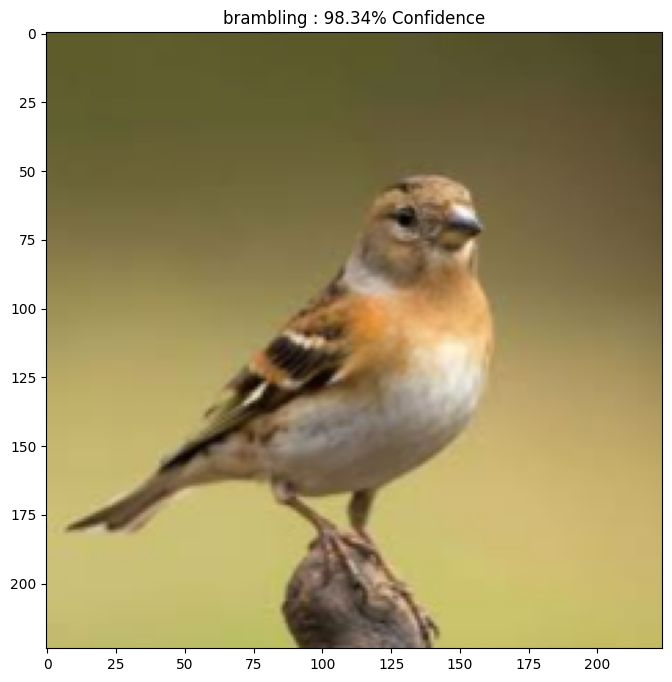

In [ ]:
plt.figure()
plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
plt.show()

In [ ]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad

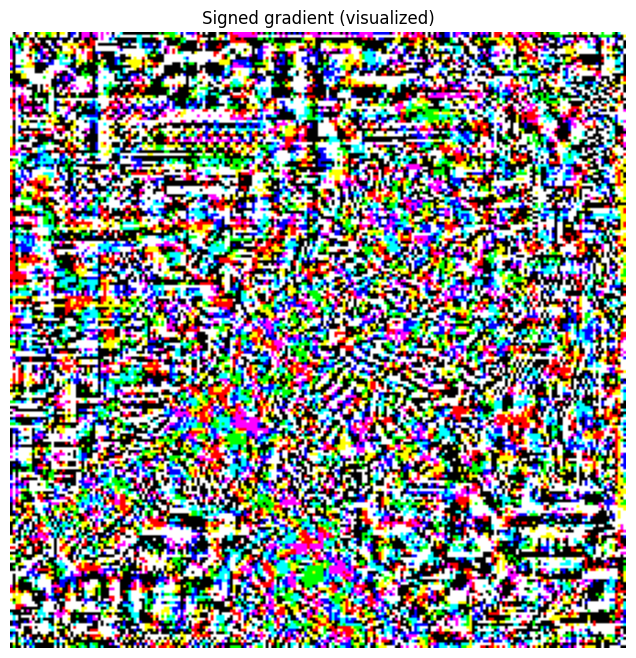

In [ ]:
# Get the input label of the image.
labrador_retriever_index = 208
label = tf.one_hot(labrador_retriever_index, image_probs.shape[-1])
label = tf.reshape(label, (1, image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image, label)
# plt.figure()
plt.imshow((perturbations[0] + 1.0) / 2.0)  # visualize signed grad -1..1 -> 0..1
plt.title("Signed gradient (visualized)")
plt.axis('off')
plt.show()

In [ ]:
def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0]*0.5+0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description,
                                                   label, confidence*100))
  plt.show()

In [ ]:
# def display_images(image, description):
#   _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
#   plt.figure()
#   plt.imshow(image[0]*0.5+0.5)
#   plt.title('{} \n {} : {:.2f}% Confidence'.format(description, label, confidence*100))
#   plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


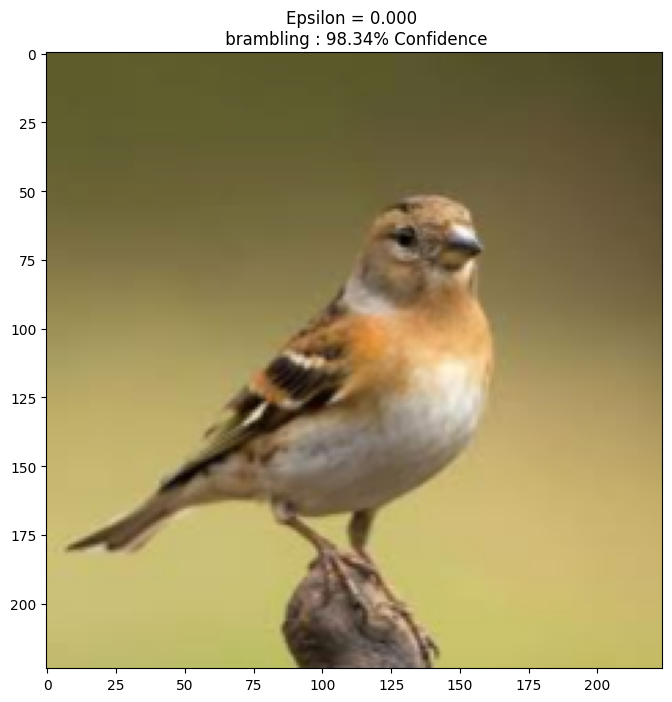

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


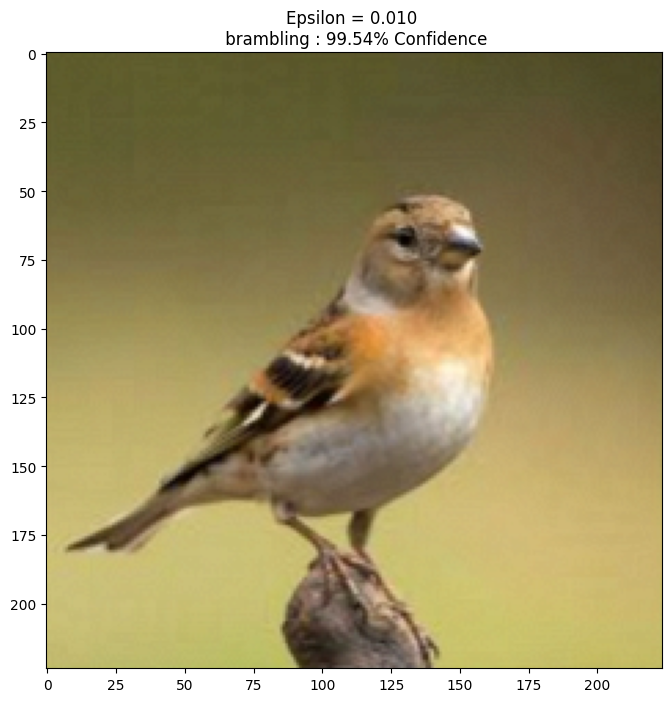

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


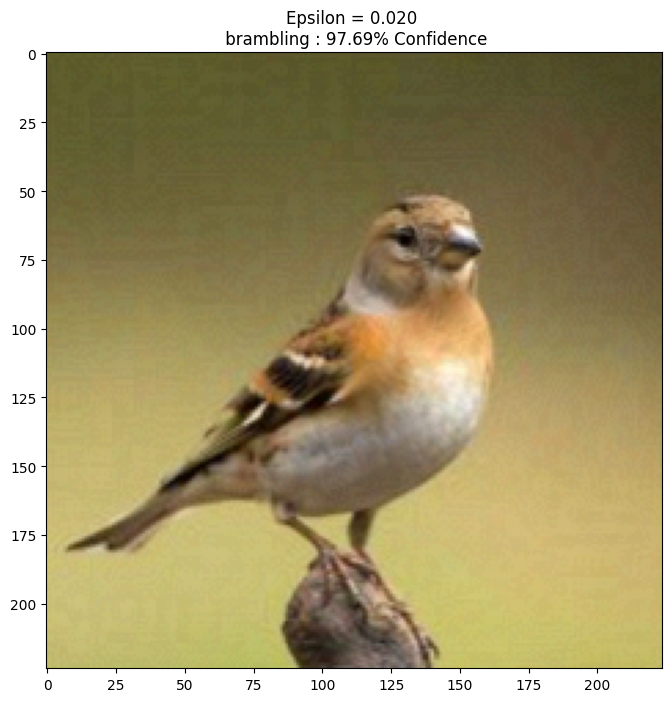

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


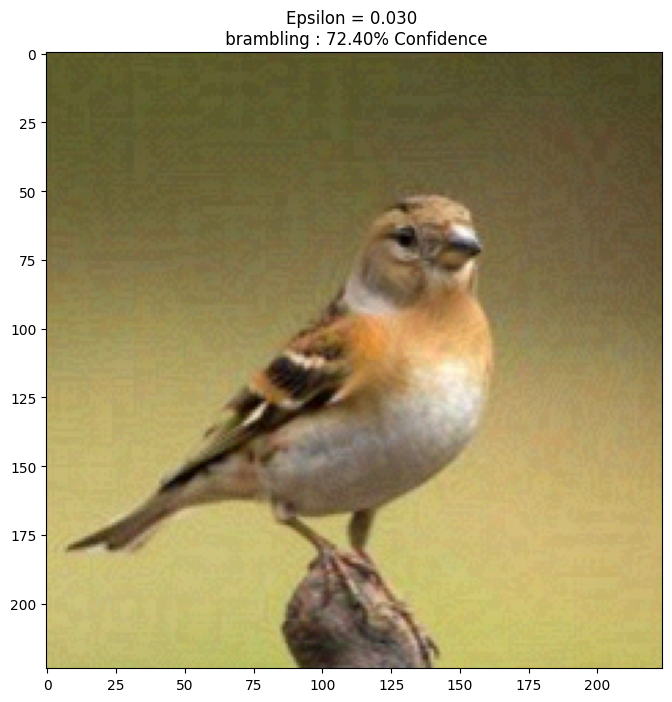

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


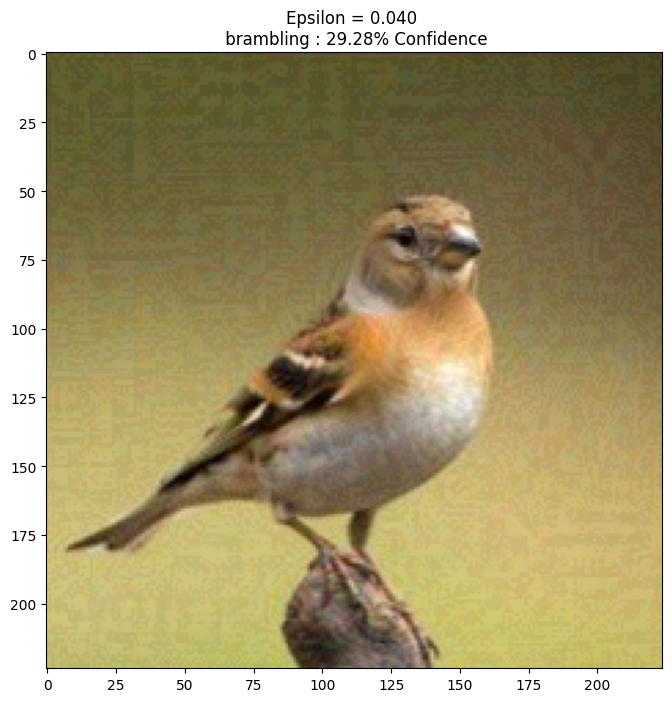

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


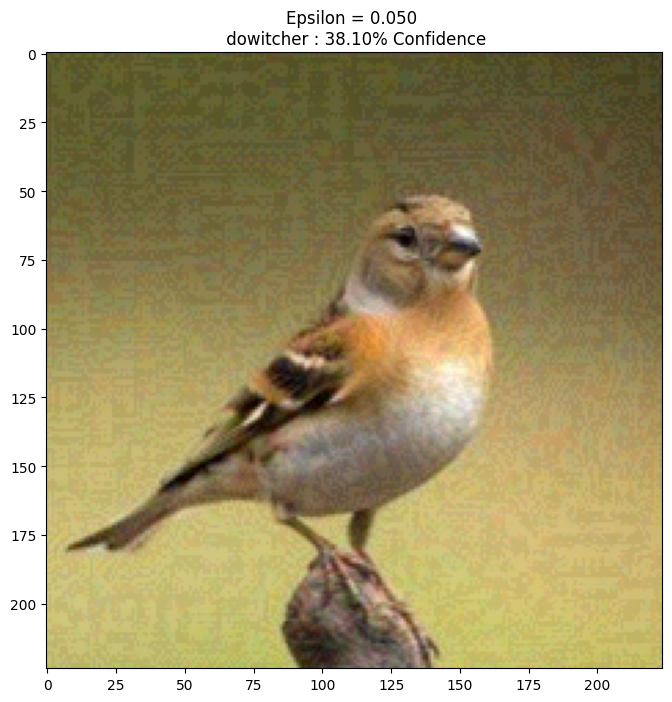

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


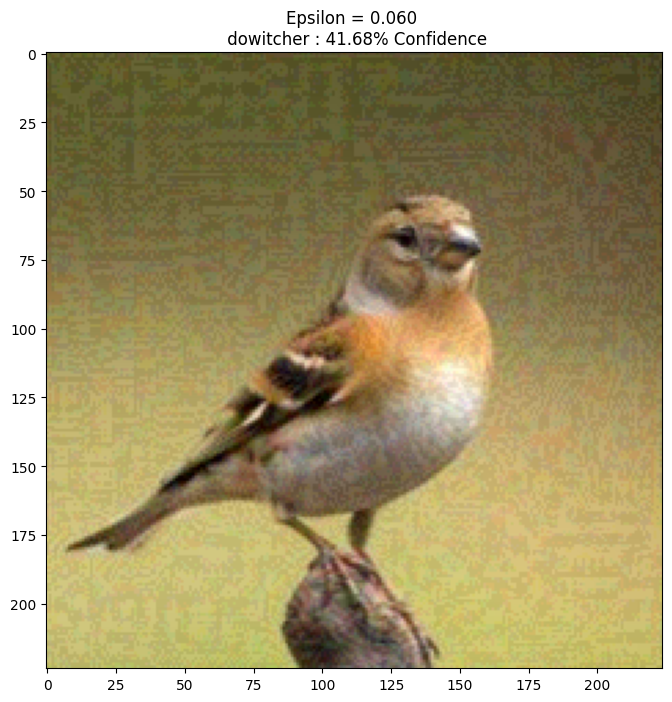

In [ ]:
epsilons = [0.00,0.01, 0.02, 0.03, 0.04, 0.05, 0.06]
descriptions = [('Epsilon = {:0.3f}'.format(eps))
                for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x, descriptions[i])

Plotting images with Gaussian noise...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


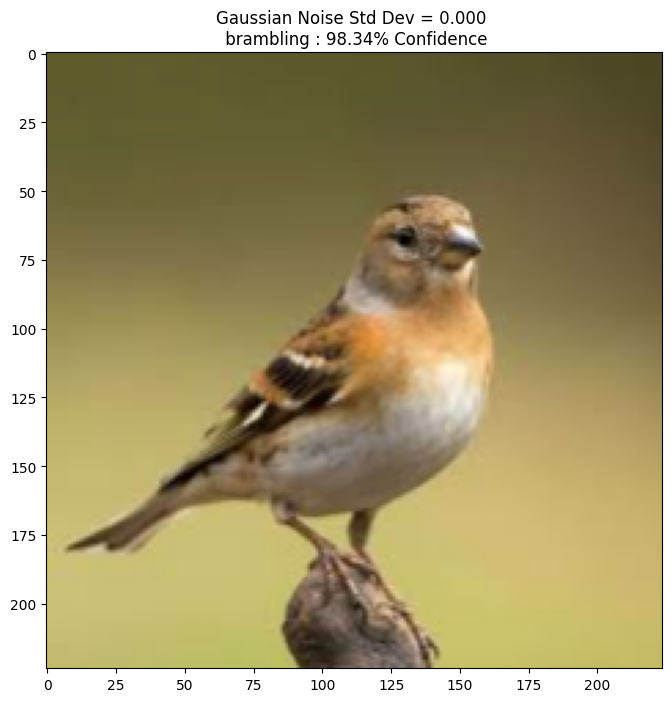

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


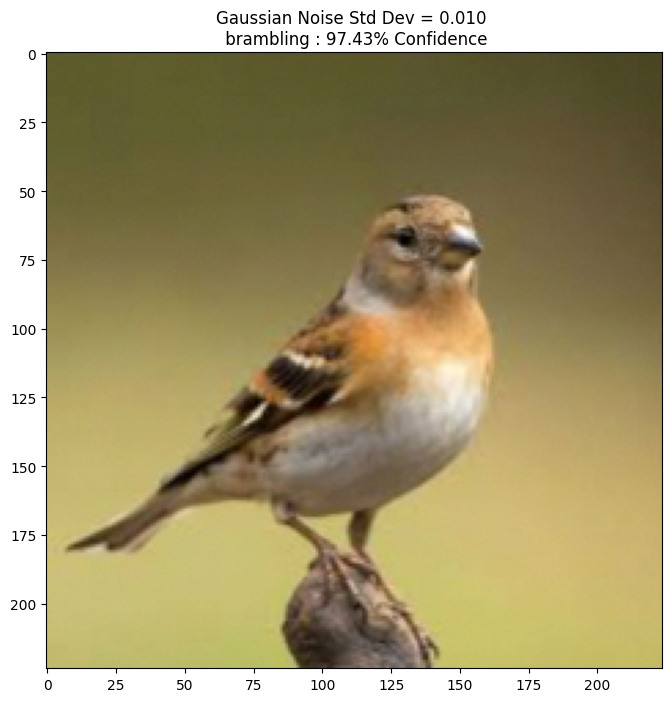

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


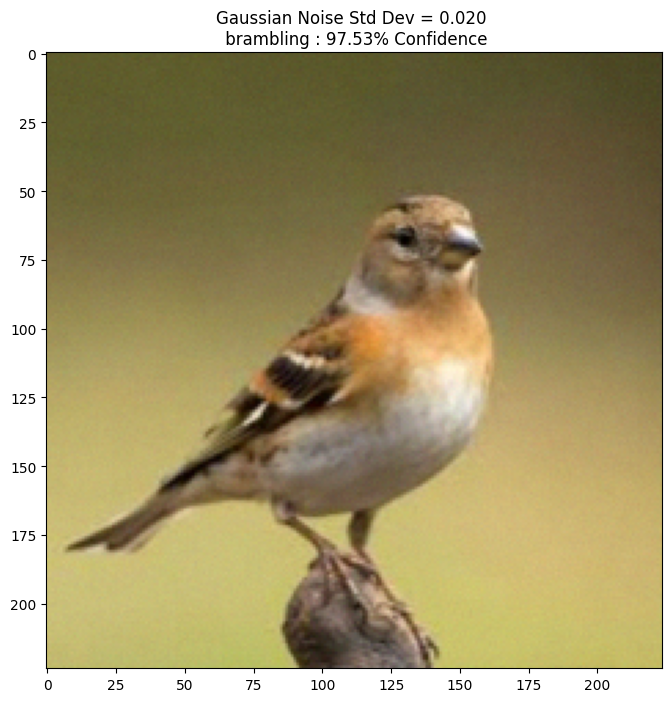

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


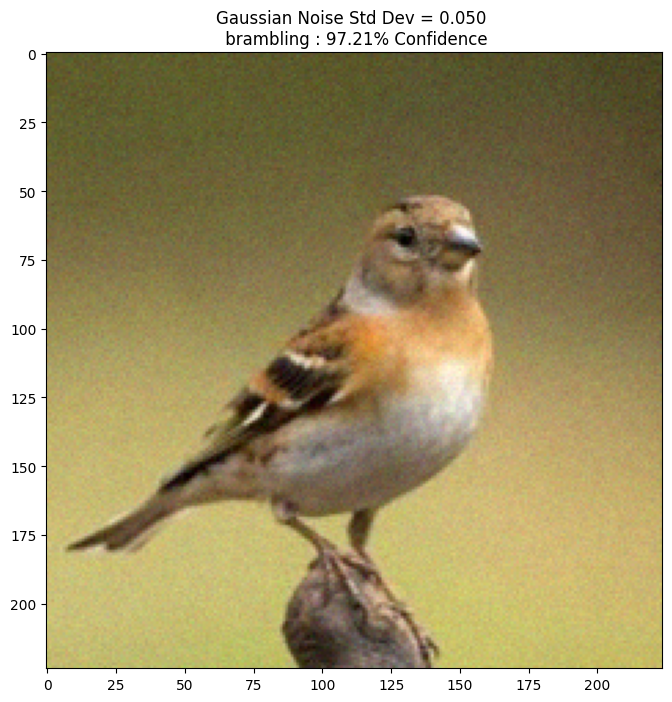

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


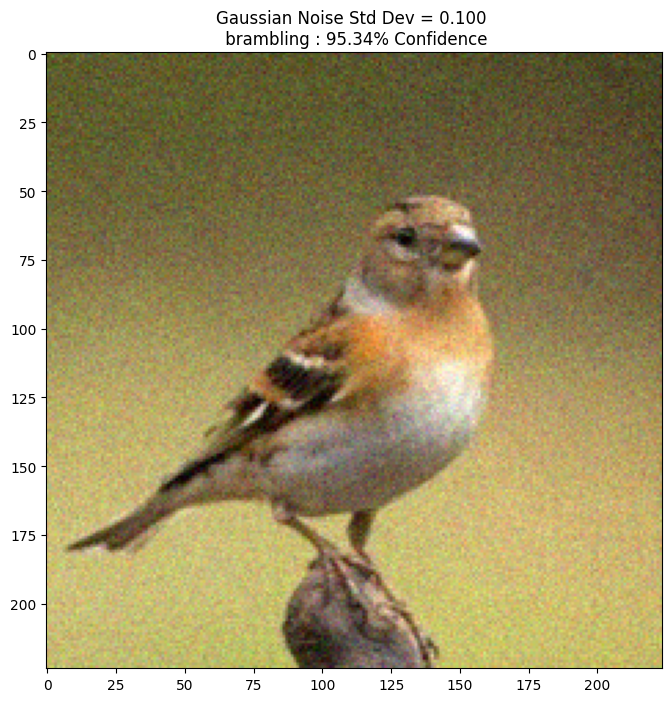

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


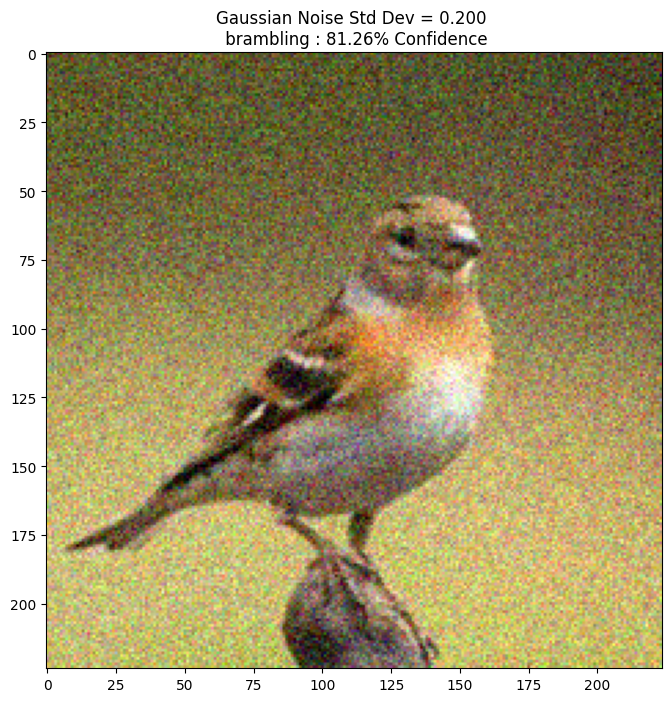

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


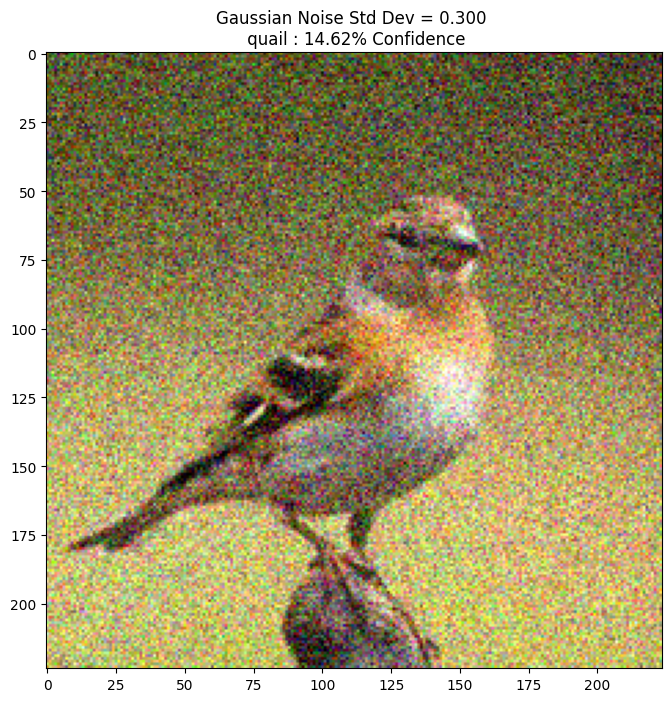

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


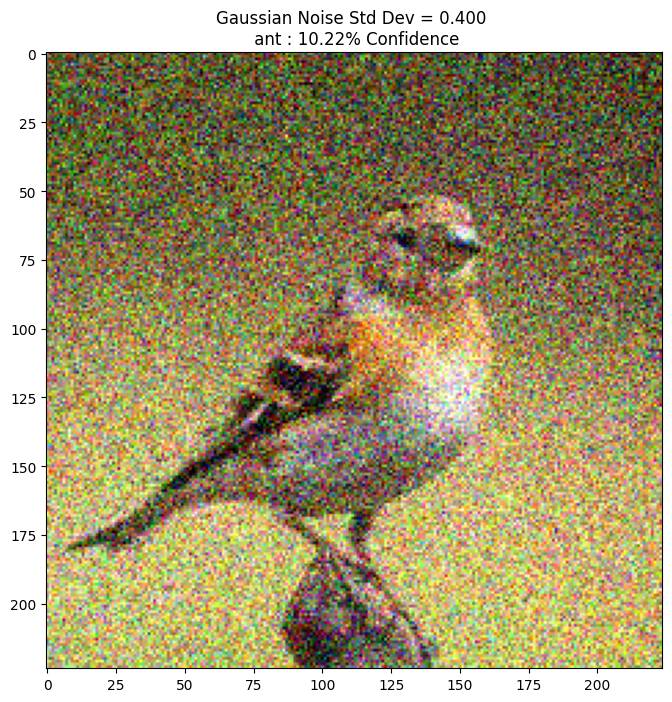

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


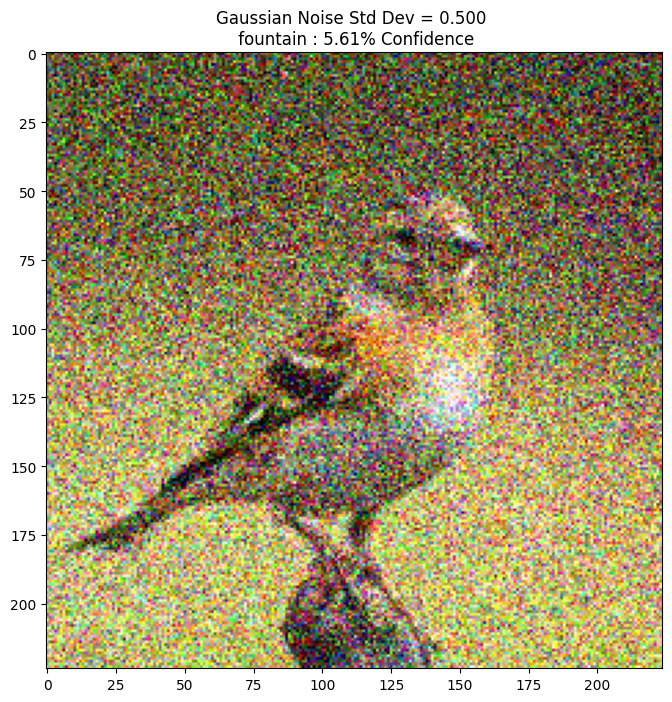

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


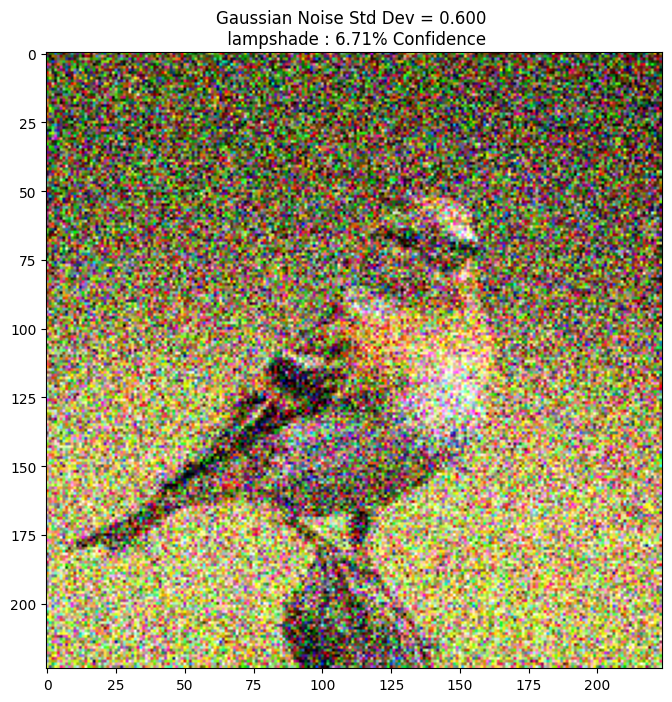

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


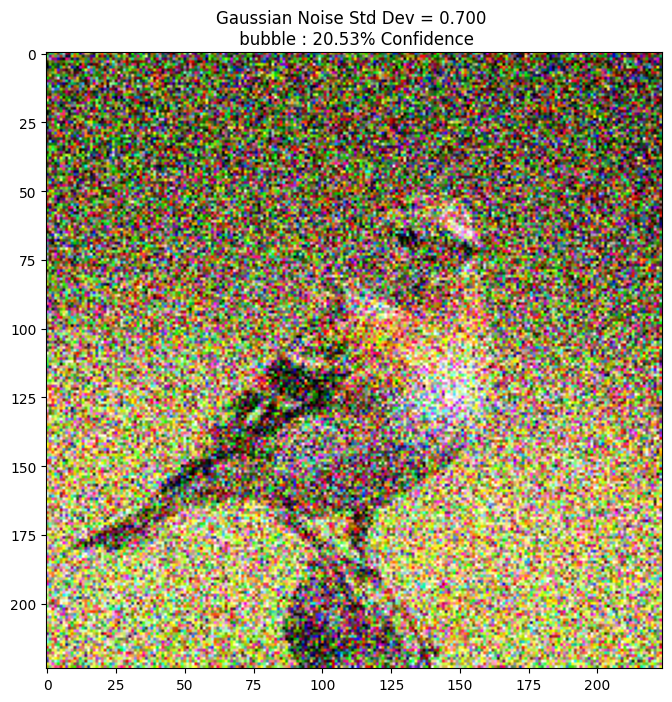

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


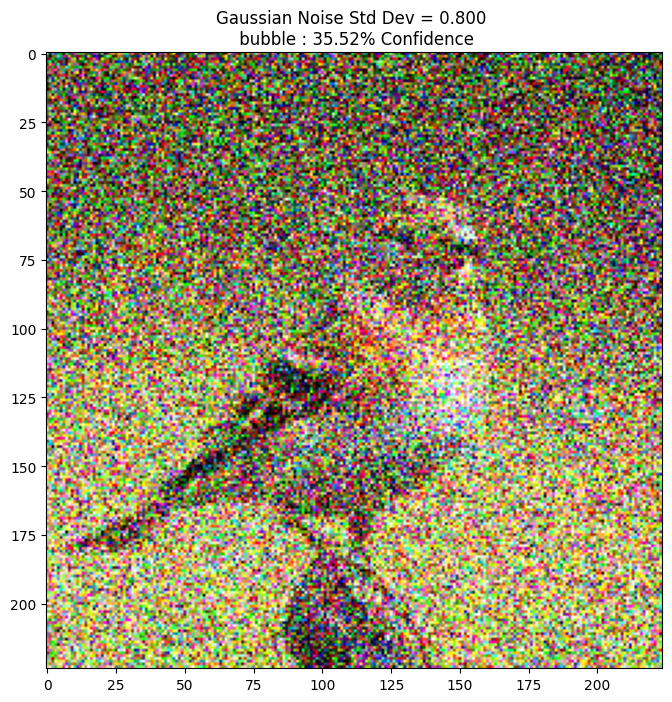

In [ ]:
# --- Gaussian noise plots (same display helper) ---
print('Plotting images with Gaussian noise...')
std_devs = [0.00,0.01, 0.02, 0.05, 0.10, 0.20, 0.3, 0.4, 0.50, 0.6, 0.7, 0.8] # noise std in preprocess domain
noise_descriptions = [('Gaussian Noise Std Dev = {:0.3f}'.format(std)) for std in std_devs]

for i, std in enumerate(std_devs):
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=std)
    noisy_image = image + noise
    noisy_image = tf.clip_by_value(noisy_image, -1.0, 1.0)
    display_images(noisy_image, noise_descriptions[i])